# **Práctica 3**: Detección de puntos relevantes y Construcción de panoramas

*Alejandro Alonso Membrilla*

## Introducción:

Esta práctica consistirá en la implementación de una serie de métodos relacionados con la detección de puntos clave y búsqueda de correspondencias entre puntos clave de distintas imágenes, todo ello encaminado hacia la reconstrucción de panoramas que se abordará en los últimos ejercicios. También se ha afrontado uno de los Bonus, el primero, sobre la programación del algoritmo RANSAC en tiempo real.

Tanto la memoria de la práctica como el código escrito y probado para la misma se encuentran incluidos en su totalidad en el presente Jupyter Notebook, que ha sido elaborado por el alumno Alejandro Alonso Membrilla utilizando la infraestructura proporcionada por Google Colab.

Las referencias consultadas para la práctica se presentan conjuntamente al final del cuaderno.

Las dos siguientes celdas sirven para conectar el cuaderno con la cuenta de Google Drive donde se alojan las imágenes usadas para los distintos ejercicio, por lo que se encuentran comentadas. 

In [1]:
#Comentar las siguientes líneas para ejecutar el siguiente script fuera de GoogleColab
#from google.colab import drive
#drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#cd '/content/gdrive/My Drive/Visión por Computador/Prácticas/P3'

/content/gdrive/My Drive/Visión por Computador/Prácticas/P3


En la siguiente celda se importan algunas bibliotecas básicas y se definen una serie de funciones, en su mayor parte escritas para prácticas anteriores, que agilizan la escritura de código superfluo para esta práctica (creación y dibujado de pirámides gaussianas, padding de matrices...).

In [3]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

def compose_pyramid_image(gp):
  shape = gp[0].shape
  gp_copy = [np.copy(x) for x in gp]
  if len(shape) == 2:
      gp_copy = [np.repeat(x[:, :, np.newaxis], 3, axis=2) for x in gp]
  rows, cols, dim = gp_copy[0].shape
  composite_image = np.zeros((rows, cols + cols // 2, 3), dtype=np.double)
  composite_image[:rows, :cols, :] = gp_copy[0]
  i_row = 0
  for p in gp_copy[1:]:
      n_rows, n_cols = p.shape[:2]
      composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
      i_row += n_rows
  return composite_image

def normalizar_matriz(im):
  minimo = min(im.ravel())
  maximo = max(im.ravel())
  rango = maximo-minimo
  return (im-minimo)/rango

def pintaI(im, figsize=(5,5)):
  im_norm = normalizar_matriz(im)
  if len(im.shape) == 2:
    cmap = 'gray'  
  else:
    cmap = None
    im_norm = im_norm[:,:,::-1] 
  plt.figure(figsize=figsize)
  plt.axis('off')
  plt.imshow( im_norm, cmap=cmap, vmin=0.0, vmax=1.0 )
  plt.show()

def pintaMIE(vim, titulos, ncol = 2, figsize=(12,12)):
  import matplotlib.pyplot as plt
  from math import ceil
  fig = plt.figure(figsize=figsize)
  #fig = plt.figure()
  for k, im in enumerate(vim):
    sub = fig.add_subplot( ceil(len(vim)/ncol), ncol, k + 1 )
    plt.axis('off')
    plt.title(titulos[k])
    im_norm = normalizar_matriz(im)
    if len(im.shape) == 2:
      cmap = 'gray'  
    else:
      cmap = None
      im_norm = im_norm[:,:,::-1] 
    sub.imshow(im_norm, cmap=cmap)
  plt.show()

def gaussian_pyramid(img, levels):
  gp = [img]
  G = img.copy()
  for i in range(levels):
    G = cv.pyrDown(G)
    gp.append(G)
  return gp

def pad_image( image, pad_size ):
  n_filas, n_cols = len(image), len(image[0])
  padded_image = np.zeros( (n_filas+2*pad_size, n_cols+2*pad_size) )
  padded_image[pad_size:n_filas+pad_size, pad_size:n_cols+pad_size] += image 
  return padded_image

## Ejercicio 1

Este ejercicio consiste en el cálculo de puntos clave mediante el criterio de Harris.

Como se ha visto en teoría, este método aplica una operación sobre los valores propios de la **matriz de Harris** en torno a un píxel dado, fundamentada a partir de lo visto en teoría y calculada como se describe en [este artículo](http://matthewalunbrown.com/papers/cvpr05.pdf), e interpreta su resultado como estimador de la tasa de cambio de la imagen en este píxel. Dicho estimador se calcula mediante la fórmula

$$ {\lambda_1\lambda_2}\over{\lambda_1+\lambda_2} $$

donde $\lambda_1$ y $\lambda_2$ son los valores propios de la matriz. El cálculo de este valor, llamado el **descriptor de Harris**, puede verse programado en la función *calcular_descriptor_harris()*, en el apartado a).



### Apartado a)

Leemos las imágenes del parque Yosemite. Aunque los cálculos que se realizarán en este ejercicio se harán usando una versión de estas imágenes en escala de grises, para la visualización de los resultados y para ejercicios posteriores también se cargarán las mismas imágenes en color.

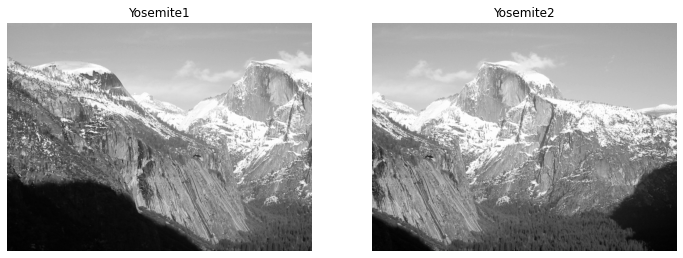

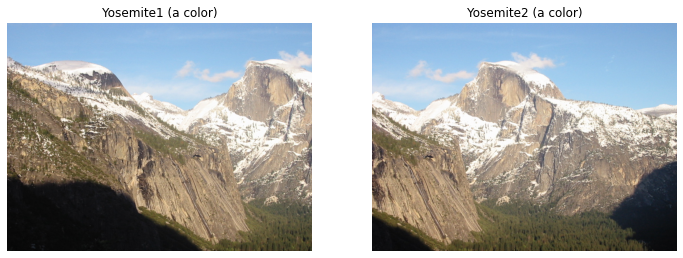

In [4]:
yose1 = cv.imread("imagenes/Yosemite1.jpg", 0)
yose2 = cv.imread("imagenes/Yosemite2.jpg", 0)
yose1color = cv.imread("imagenes/Yosemite1.jpg", 1)
yose2color = cv.imread("imagenes/Yosemite2.jpg", 1)
pintaMIE([yose1,yose2], ["Yosemite1", "Yosemite2"])
pintaMIE([yose1color,yose2color], ["Yosemite1 (a color)", "Yosemite2 (a color)"])

Creamos la pirámide gaussiana de 3 niveles para cada imagen. Para ello hemos hecho uso del método pyrDown() de OpenCV que, como vimos en la práctica 1, aplica una máscara de suavizado muy similar a aplicar un suavizado gaussiano de $\sigma=1$, como se hace en el artículo antes mencionado.

In [5]:
levels = 2
gp1 = gaussian_pyramid(yose1, levels)
gp2 = gaussian_pyramid(yose2, levels)
gp1color = gaussian_pyramid(yose1color, levels)
gp2color = gaussian_pyramid(yose2color, levels)

In [6]:
gp_imgs = [compose_pyramid_image(gp) for gp in (gp1,gp2,gp1color,gp2color)]

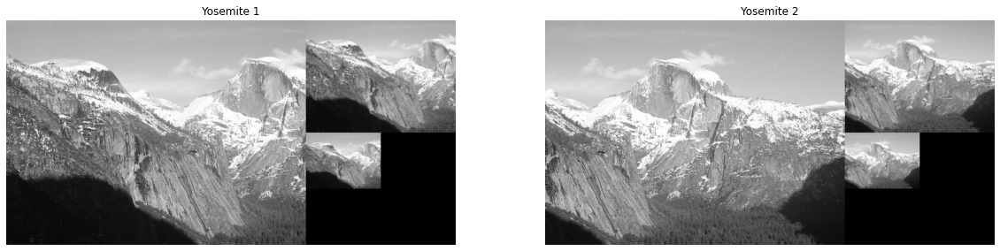

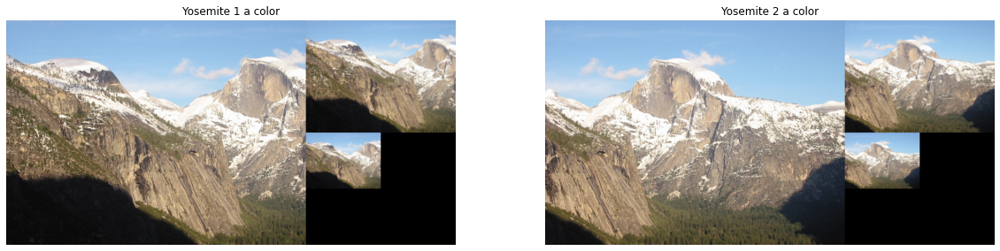

In [7]:
pintaMIE([gp_imgs[0], gp_imgs[1]], ["Yosemite 1", "Yosemite 2"], figsize=(20,20))
pintaMIE([gp_imgs[2], gp_imgs[3]], ["Yosemite 1 a color", "Yosemite 2 a color"], figsize=(20,20))

A continuación implementamos el cálculo del descriptor de Harris como se describió al principio del ejercicio, sumando un valor casi nulo al denominador para evitar la posible división por 0 que podría darse, por ejemplo, en los puntos de las zonas negras de la imagen (abajo a la izquierda) donde esta permanece constante y, por tanto, tanto la matriz de gradientes como la matriz de Harris como los valores propios de la misma serán nulos.

El valor añadido al denominador ($10^{-12}$) no tendrá ningún efecto en los puntos en los que el determinante de H valga exactamente 0, y su influencia será muy poco significativa en otro caso puesto que cuando $\lambda_1$ y $\lambda_2$ sean del orden de $10^{-12}$ su producto será del orden de $10^{-24}$, y el descriptor de Harris tendrá un valor muy bajo por lo que será eliminado en la fase de supresión de no máximos.

In [8]:
def calcular_descriptor_harris(img, blockSize=3, ksize=5):
  corners = cv.cornerEigenValsAndVecs(img, blockSize=blockSize, ksize=ksize)
  lambda1 = corners[:,:,0]
  lambda2 = corners[:,:,1]
  return lambda1*lambda2/(lambda1+lambda2+0.0000000000001)

El tamaño de bloque y el de apertura del operador de Sobel (ksize) usados por la función *cornerEigenValsAndVecs()* se han ajustado a 3 y 5 respectivamente al haberse comprobado experimentalmente que estos valores aumentaban el número de puntos clave detectados (en torno a 800 para blockSize=5, ksize=3; 1100 para blockSize=3, ksize=3; 1800 para blockSize=3, ksize=5), lo que ha sido necesario para llegar a un número de keypoints del orden que se pedía en el guión para el apartado b).

In [9]:
blockSize = 3
ksize = 5
gp1_harris = [ calcular_descriptor_harris(nivel, blockSize=blockSize, ksize=ksize) for nivel in gp1 ]
gp2_harris = [ calcular_descriptor_harris(nivel, blockSize=blockSize, ksize=ksize) for nivel in gp2 ]

Las siguientes imágenes muestran el valor del descriptor de harris (normalizado a escala de grises) para cada punto de cada nivel de la pirámide gaussiana de ambas fotografías.

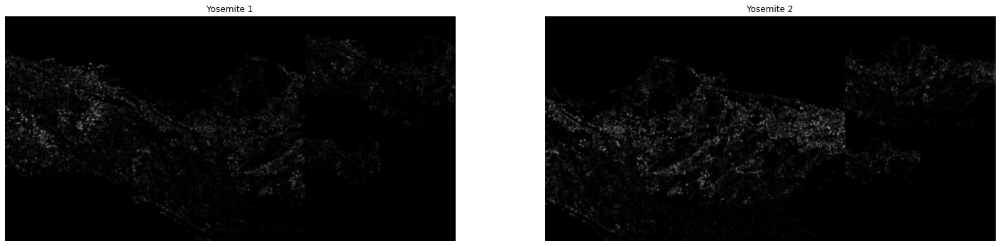

In [10]:
pintaMIE([compose_pyramid_image(gp1_harris), compose_pyramid_image(gp2_harris)], ["Yosemite 1", "Yosemite 2"], figsize=(25,25))

### Apartado b): 

En este apartado implementaremos la supresión de no máximos sobre los descriptores de Harris.

El método propuesto consiste en:

1. Rodear la matriz con marcos (*padding*) de 0s del mismo grosor que la distancia mínima establecida entre máximos (radio).
2. Recorrer cada elemento de la matriz de descriptores de Harris.
3. Paralelamente se tiene una matriz booleana que recoge si un elemento necesita ser comprobado como máximo.
4. Para cada elemento, si es escogible como máximo, se miran todos los valores del bloque de radio establecido con dicho elemento como centro.
5. Si ese elemento es máximo en su vecindad y supera cierto umbral se añade a la lista de máximos.
6.  Si un elemento es un máximo en su vecindad todos los elementos de dicha vecindad se marcan en la matriz booleana como no escogibles.  

In [11]:
def max_locales(harris_im, radius=5, thres=0.0001):
  n_rows, n_cols = harris_im.shape
  elegible = pad_image(np.ones(harris_im.shape, dtype=bool), radius)
  padded_mat = pad_image(harris_im, radius)
  max_loc_idx = []
  for i, row in enumerate(padded_mat[radius+1:radius+n_rows]):
    for j, elem in enumerate(row[radius+1:radius+n_cols]):
      if elegible[i+radius, j+radius]:
        block = padded_mat[i:i+2*radius+1, j:j+2*radius+1]    #i y j se encuentran desplazados con respecto a sus respectivos índices en padded_mat
        if elem == np.max(block.ravel()) and elem > thres:
          elegible[i:i+2*radius+1, j:j+2*radius+1] = np.zeros((2*radius+1, 2*radius+1), dtype=bool)
          max_loc_idx.append([i,j])
  return max_loc_idx

Procedemos a calcular los puntos máximos a partir de los descriptores de Harris extraídos:

In [12]:
#Ventana de tamaño 9x9
r = 4
umbral = 0.005
gp1_max = [ max_locales(harris_im, radius=r, thres=umbral) for harris_im in gp1_harris ]
gp2_max = [ max_locales(harris_im, radius=r, thres=umbral) for harris_im in gp2_harris ]

In [13]:
print("Puntos máximos detectados en la primera imagen:")
print([len(x) for x in gp1_max], "-> Total: {}".format(len(np.row_stack(gp1_max))))
print(["{:.3f}%".format(len(x)/len(np.row_stack(gp1_max))) for x in gp1_max])
print("\nPuntos máximos detectados en la segunda imagen:")
print([len(x) for x in gp2_max], "-> Total: {}".format(len(np.row_stack(gp2_max))))
print(["{:.3f}%".format(len(x)/len(np.row_stack(gp2_max))) for x in gp2_max])

Puntos máximos detectados en la primera imagen:
[1349, 358, 88] -> Total: 1795
['0.752%', '0.199%', '0.049%']

Puntos máximos detectados en la segunda imagen:
[1371, 342, 89] -> Total: 1802
['0.761%', '0.190%', '0.049%']


Usando bloques de 9x9 en la supresión de no máximos y con un umbral mínimo de valor del descriptor de Harris de 0.005, obtenemos en torno a 1800 puntos clave por cada imagen. El primer nivel registra en torno al 75% de las esquinas totales en cada imagen, el segundo nivel el 20% y el tercero el 5%, cerca de la proporción dada como guía en el guión de prácticas. Los parámetros escogidos para el experimento se consideran válidos en tanto que el número de puntos clave y su distribución en las distintas octavas se ajusta a lo pedido en el enunciado de este apartado. Posteriormente, en el apartado d), visualizaremos los resultados y constataremos que los puntos clave encontrados son relevantes y se localizan en zonas destacables y con mayor número de esquinas de la imagen.

Con 1800 puntos clave por imagen y la distribución observada de los mismos en las distintas octavas consideramos que los puntos obtenidos representan adecuadamente sus respectivas imágenes.

### Apartado c)

Ahora definimos los objetos KeyPoint a partir de los máximos calculados anteriormente, lo que nos permitirá representarlos en el apartado siguiente de forma sencilla usando rutinas de OpenCV.

Sobre el proceso de definición de las estructuras KeyPoint cabe destacar varios detalles:

*   Para la escala pasada como parámetro al constructor de KeyPoint, se ha considerado un multiplicador de tamaño que se le puede pasar opcionalmente a la función *definir_keypoints()* como argumento.
*   El suavizado previo al cálculo de la orientación se ha hecho usando el método *GaussianBlur()* de OpenCV, visto en la práctica 1, con un $\sigma=4.5$.
*   Los valores almacenados en el cálculo de máximos se corresponden con sus índices (fila, columna) en un array de Numpy. OpenCV, sin embargo, utiliza coordenadas del tipo (x,y)=(columna,fila), por lo que invertimos su orden de entrada al construir la estructura KeyPoint.



In [14]:
#gp -> pirámide gaussiana de una imagen
#gp_max -> pirámide con los índices de puntos clave por cada nivel
def definir_keypoints(gp, gp_max, scale_mult=1.0):
  keypoints = []
  for nv in range(levels+1):
  #for nv in range(1):
    #Necesitamos la posición (ya la tenemos), la escala y la orientación (gradiente) de cada punto
    scale = 2**(nv)*blockSize*scale_mult
    im = cv.GaussianBlur(gp[nv], ksize=(0,0), sigmaX=4.5)
    dx, dy = cv.spatialGradient(im)
    for y, x in gp_max[nv]:   #Hemos almacenado las esquinas como (fila, columna). OpenCV utiliza coordenadas del tipo (x,y)=(columna,fila)
      #Vamos a calcular la orientación de cada gradiente con np.angle, que opera sobre números complejos
      grad = np.array(dx[y, x], dtype=complex)
      grad.imag = dy[y, x]
      angle = float(np.angle(grad, deg=True))
      keypoints.append( cv.KeyPoint(2**nv*x, 2**nv*y, _size=scale, _angle=angle) ) 
  return keypoints

De acuerdo a los resultados visualizados en el apartado d), hemos considerado oportuno definir dos listas de KeyPoints para cada imagen: una con la escala que establecida en el enunciado del apartado c), y otra con un radio escalado (x3) que nos permite ver con más claridad la orientación de cada esquina detectada.

In [15]:
keypoints1 = definir_keypoints(gp1, gp1_max)
keypoints2 = definir_keypoints(gp2, gp2_max)
keypoints_big1 = definir_keypoints(gp1, gp1_max, scale_mult=3.0)
keypoints_big2 = definir_keypoints(gp2, gp2_max, scale_mult=3.0)

### Apartado d)

Dibujamos los KeyPoints usando la función drawKeypoints de OpenCV. 

El flag DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS indica que se van a representar los distintos KeyPoints en sus respectivas escalas y orientaciones.

In [16]:
%%capture
yose1_keypoints = cv.drawKeypoints(yose1color, keypoints1, None, color=(0,0,255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
yose2_keypoints = cv.drawKeypoints(yose2color, keypoints2, None, color=(0,0,255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
yose1_keypoints_big = cv.drawKeypoints(yose1color, keypoints_big1, None, color=(0,0,255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
yose2_keypoints_big = cv.drawKeypoints(yose2color, keypoints_big2, None, color=(0,0,255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [17]:
pintaMIE([yose1_keypoints, yose2_keypoints], ["Keypoints de Yosemite 1", "Keypoints de Yosemite 2"], figsize=(20,20))
pintaMIE([yose1_keypoints_big, yose2_keypoints_big], ["Keypoints de Yosemite 1 (agrandados)", "Keypoints de Yosemite 2 (agrandados)"], figsize=(20,20))

Output hidden; open in https://colab.research.google.com to view.

Los resultados obtenidos son, a falta del refinamiento que vendrá en el apartado siguiente, satisfactorios. Los puntos clave claramente tienden a evitar zonas planas como las sombras, el cielo o la nieve. Además, puede verse en las primeras imágenes (sin agrandar las escalas) que los puntos clave tienden a condensarse en los bordes de la montaña, y puede verse a simple vista que a menudo los puntos detectados en las zonas comunes para ambas imágenes coinciden. Si vemos las imágenes con escalas agrandadas observamos que la orientación registrada para las distintas esquinas no está escogida al azar, sino que tiende a ser perpendicular a la línea o contorno en el que se encuentra.

### Apartado e)

Refinamiento subpíxel de los puntos clave. Aplicaremos la función *cornerSubPix()* de OpenCV.

De nuevo, empezamos agrupando todos los puntos clave en una misma estructura, invirtiendo las coordenadas al formato (x,y) utilizado por OpenCV.

In [18]:
######EJECUTAR ESTA CELDA SOLO UNA VEZ (O UN NÚMERO IMPAR DE VECES) PARA TENER 
###### EL ORDEN ADECUADO DE LAS COORDENADAS

#Hemos ido almacenando las coordenadas en formato (fila,columna). OpenCV trabaja con
# coordenadas (x,y)=(columna,fila), así que invertimos el orden de cada una
corners1 = [ [x[1],x[0]] for x in np.row_stack(gp1_max)]
corners2 = [ [x[1],x[0]] for x in np.row_stack(gp2_max)]

#Los convertimos a np.float32 para el correcto funcionamiento de OpenCV
corners1 = np.array(corners1, dtype=np.float32)
corners2 = np.array(corners2, dtype=np.float32)

Para el refinamiento se ha tenido en cuenta una ventana de radio 5 (bloque 11x11 centrado en el píxel) donde se ha realizado el refinamiento, puesto que para el número de máximos que se pretenden refinar (unos 3600 en total), tomar este tamaño de ventana no supone un problema en cuanto a velocidad de cómputo.

El criterio de parada para el algoritmo de refinamiento son en realidad dos criterios simultáneos ampliamente utilizados en optimización: numero máximo de iteraciones (TERM_CRITERIA_COUNT, hasta 40 iteraciones) y valor de mejora bajo cierto umbral (TERM_CRITERIA_EPS, $\epsilon=0.001$). De esta forma no solo establecemos un tiempo de cálculo máximo, sino que ganamos en eficiencia al detener la ejecución de forma prematura cuando no estamos obteniendo mejoras significativas.

In [19]:
#Devuelve el refinamiento subpíxel. Corners debe ser un array de numpy en formato float32
def subpix_refinement(img, corners, winSize=(5,5), zeroZone=(-1,-1), criteria=(cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_COUNT, 40, 0.001)):
  corners_copy = np.copy(corners)
  return cv.cornerSubPix(img, corners_copy, winSize, zeroZone, criteria)

#Permite ver cuántas coordenadas han cambiado con el refinamiento (asume que la coordenda original y su refinamiento
# están en la misma posición de sus respectivos arrays)
def count_changes(corners, refined_corners):
  changes = np.array(corners, dtype=np.float32) == refined_corners
  changes = np.array([0 if c[0]==True and c[1]==True else 1 for c in changes])
  return np.sum(changes)

In [20]:
refined_corners1 = subpix_refinement(yose1, corners1)
refined_corners2 = subpix_refinement(yose2, corners2)

Para la interpretabilidad de los resultados, se ha contado el número de casos en los que el refinamiento ha llevado a un cambio en el punto marcado como máximo local.

In [21]:
#Vemos cuántas coordenadas han cambiado su posición en el refinamiento
print("Cambios al refinar la primera imagen:", count_changes(corners1, refined_corners1))
print("Cambios al refinar la segunda imagen:", count_changes(corners2, refined_corners2))

Cambios al refinar la primera imagen: 1006
Cambios al refinar la segunda imagen: 978


A continuación definimos y utilizamos una función que nos permite visualizar los refinamientos realizados (en una ventana 20x20 en torno al píxel originalmente marcado como máximo, aumentada mediante interpolación bilineal con un zoom de x10). Cada vez que se llama a la siguiente función se toman tres casos de refinamientos de forma aleatoria. Se marca la posición del máximo original en el centro de la imagen y la del máximo refinado donde este se localice. Recuérdese que los máximos se han buscado en toda la imagen (cerca de los bordes también), así que la imagen aumentada resultante puede aparecer con marcos negros representando los bordes de la imagen.

In [22]:
def visualize_subpix_refinement(img, corners, refined_corners, r=10, n_samples=3):
  indices = np.random.choice(len(corners), n_samples)
  padded_img = pad_image(img, r)
  comp_imgs = []
  for i in indices:
    x, y = int(corners[i][0]), int(corners[i][1])
    x_ref, y_ref = refined_corners[i][0], refined_corners[i][1]
    zoom = padded_img[y:y+2*r+1, x:x+2*r+1]
    x_zoom, y_zoom = r, r
    x_ref_zoom, y_ref_zoom = int(y_zoom+y_ref-y), int(x_zoom+x_ref-x)
    cv.circle(zoom, (y_zoom, x_zoom), 1, (0,0,255), thickness=False)   #Le añade un círculo rojo a la posición original de la esquina
    cv.circle(zoom, (y_ref_zoom, x_ref_zoom), 1, (0,255,0), thickness=False)    #Le añade un círculo verde a la posición refinada
    cv.resize(zoom, ((2*r+1)*10, (2*r+1)*10))   #Aplica un zoom de x20 sobre la zona recortada
    comp_imgs.append(zoom)
  pintaMIE(comp_imgs, ["Ejemplo {}".format(i+1) for i in range(n_samples)], ncol=3, figsize=None)

Ejemplos de refinamiento de esquinas en la primera imagen:


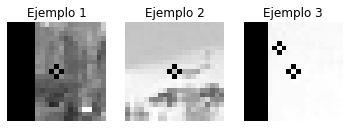



Ejemplos de refinamiento de esquinas en la segunda imagen:


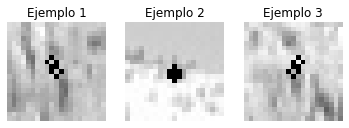

In [23]:
print("Ejemplos de refinamiento de esquinas en la primera imagen:")
visualize_subpix_refinement(yose1, corners1, refined_corners1)

print("\n\nEjemplos de refinamiento de esquinas en la segunda imagen:")
visualize_subpix_refinement(yose2, corners2, refined_corners2)

Téngase en cuenta que no todas las esquinas han sido refinadas (algo menos de la mitad de las esquinas no han cambiado su posición). Por tanto, es normal que al visualizar tres ejemplos aleatorios de refinamiento en cualquiera de las dos imágenes nos encontremos con ejemplos en los que solo aparece la marca central (ambas marcas se encontrarían en el mismo sitio).

## Ejercicio 2

Este ejercicio consiste en el cálculo de correspondencias correctas entre los puntos clave de dos imágenes usando las herramientas dispuestas por OpenCV. Para evitar desviaciones derivadas de un cálculo incorrecto de los puntos Harris en el ejercicio anterior, repetiremos este procedimiento usando el detector-descriptor AKAZE, implementado por OpenCV. De nuevo utilizaremos las imágenes de Yosemite como ejemplo.

In [24]:
#Detección de keypoints y cómputo de los descriptores 
nOct = 3  #Nº de niveles en los que AKAZE busca keypoints. 4 es el valor por defecto.
thres = 0.0004  #Valor mínimo para ser considerado como punto clave. 0.001 es el valor por defecto.
akaze = cv.AKAZE_create(threshold=thres, nOctaves=nOct)
kp1, desc1 = akaze.detectAndCompute(yose1color, None)
kp2, desc2 = akaze.detectAndCompute(yose2color, None)

In [25]:
print(len(kp1))
print(len(kp2))

2183
1861


Hemos establecido el número de octavas en los que AKAZE detecta keypoints a 3 para trabajar en las mismas condiciones que en el apartado anterior (con una pirámide gaussiana de 3 niveles). El umbral mínimo para la detección es de 0.0004, puesto que para este valor obtenemos un número de puntos clave por imagen en torno a los 2000 que se daban en el enunciado del ejercicio 1 a modo de indicación. 

Dados los puntos claves y sus descriptores, empezamos calculando correspondencias por fuerza bruta. Para cada keypoint, se encuentra el punto clave de la otra imagen cuyo descriptor es el más parecido al propio. Si esta situación es recíproca, es decir si el punto clave de la propia imagen más parecido a la correspondencia encontrada es el propio keypoint (*cross-check*), entonces se guardan ambos puntos a modo de pareja o *match*.

In [26]:
bf = cv.BFMatcher_create(normType=cv.NORM_L2, crossCheck=True)
matches = bf.match(desc1, desc2)

In [27]:
len(matches)

1048

Vemos que solamente la mitad de los puntos clave han encontrado una correspondencia en la otra que supere el *cross-check*. Esto es razonable, teniendo en cuenta que no todo el contenido de una imagen es compartido por la otra. Si todos los puntos clave encontrados tuviesen una correspondencia, sabríamos con toda seguridad que se están emparejando puntos sin relación alguna.

La siguiente función muestra por pantalla ambas imágenes, una junto a la otra, y traza líneas uniendo cierto número de parejas encontradas, seleccionadas del total de forma aleatoria. El número por defecto de correspondencias a dibujar se ha fijado a 100, tal como se pide en el ejercicio.

In [28]:
def show_random_pairs(img1, img2, kp1, kp2, matches, n_samples=100, matchColor=(0,0,255), figsize=(15,15)):
  indices = np.random.choice(len(matches), n_samples)
  img_match = cv.drawMatches( img1, kp1, img2, kp2, np.asarray(matches,dtype=object)[indices], None, matchColor=matchColor, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS )  
  pintaI(img_match, figsize=figsize)

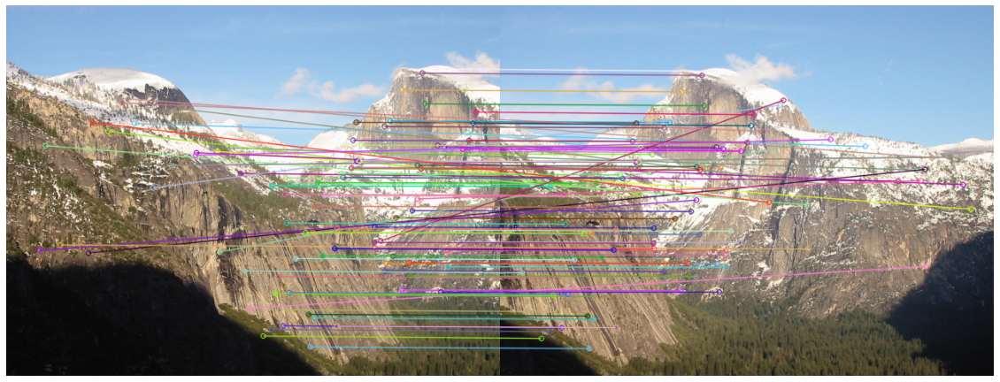

In [29]:
show_random_pairs(yose1color, yose2color, kp1, kp2, matches, matchColor=None, figsize=(20,20))

Observamos que hay una serie de correspondencias que pueden clasificarse como erróneas a simple vista. También que las líneas uniendo correspondencias aparentemente correctas son paralelas y de prácticamente la misma longitud, lo cual encaja con la conclusión que podíamos alcanzar mirando ambas imágenes: cada una es, salvando las regiones no comunes entre ambas imágenes, una traslación de la otra.

Vamos a refinar esta lista de emparejamientos aplicando el criterio Lowe-Average-2NN sobre las correspondencias anteriores para eliminar las correspondencias menos adecuadas.

In [30]:
def narrow_matches_with_lowe2NN(desc1, desc2, matches, thres=0.5):
  narrowed_matches = []
  for m in matches:
    #Calculamos la distancia de este punto (imagen de la izquierda) a cada uno de los demás
    dists = np.linalg.norm(desc1[m.queryIdx]-desc2, axis=1)   
    sorted_id = dists.argsort()[::-1]
    #Necesitamos la media de las características de los segundos puntos mejores (f'_2)
    second_bests = []
    for i in sorted_id[1:]:
      if dists[sorted_id[1]] == dists[i]:    #Si un elemento es igual de bueno que el segundo también lo consideramos
        second_bests.append(i)
      else:                                  #Todos los siguientes son peores, así que dejamos de buscar
        break
    second_bests = np.array(second_bests)
    mean_second_feat = np.mean(desc2[second_bests], axis=0)
    if m.distance/np.linalg.norm(desc1[m.queryIdx]-mean_second_feat) < thres:
      narrowed_matches.append(m)
  return narrowed_matches

El *threshold* o umbral que se le pasa como parámetro establece el valor máximo del ratio de Lowe, tal que solo se aceptan correspondencias con dicho ratio por debajo de ese umbral.

Recordamos que el ratio de Lowe se escribe como:

$$||f_1-f_2||\over||f_1-f_2'||$$

donde $f_1$ y $f_2$ son, respectivamente, los descriptores del keypoint original y su mejor correspondencia. $f_2'$ es la media de los descriptores de sus segundas mejores correspondencias. Por tanto, cuanto menor sea el valor de este ratio mayor será la diferencia entre las mejores correspondencias y sus segundas mejores (estaremos eligiendo aquellas parejas que muestren muy claramente que son correctas).

Comenzamos con un umbral de 0.6.

In [31]:
narrowed_matches = narrow_matches_with_lowe2NN(desc1, desc2, matches, thres=0.6)

In [32]:
len(narrowed_matches)

935

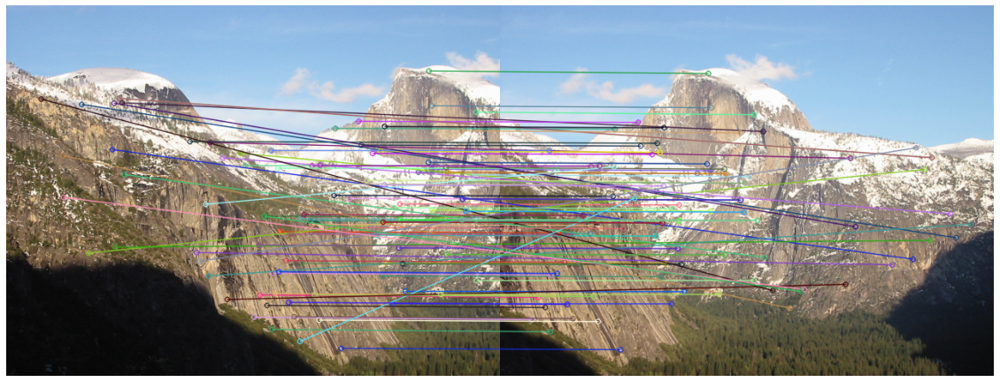

In [33]:
show_random_pairs(yose1color, yose2color, kp1, kp2, narrowed_matches, matchColor=None, figsize=(20,20))

Vemos que el número de correspondencias no se reduce mucho, pasando de 1048 a 935. Al dibujar las correspondencias encontramos que siguen quedando numerosas correspodencias erróneas.

Reduciendo un poco más el umbral...

In [34]:
narrowed_matches = narrow_matches_with_lowe2NN(desc1, desc2, matches, thres=0.3)

In [35]:
len(narrowed_matches)

520

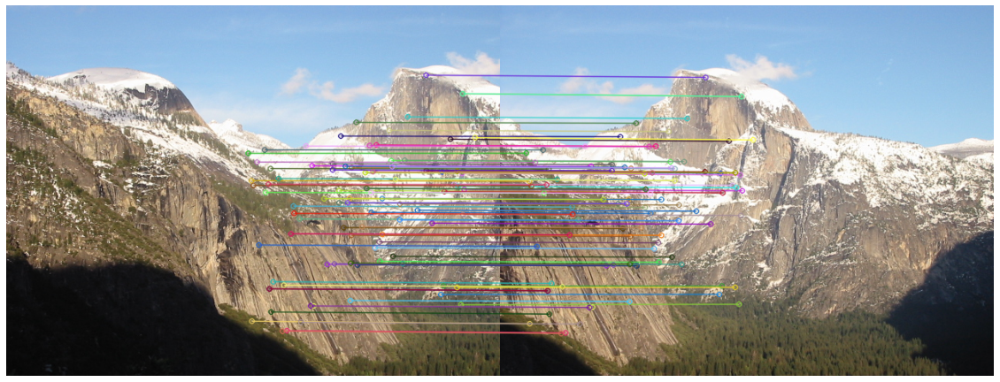

In [36]:
show_random_pairs(yose1color, yose2color, kp1, kp2, narrowed_matches, matchColor=None, figsize=(20,20))

El número de correspondencias queda reducido a 520 y todas las parejas que aparecen ahora son buenas, o al menos lo parecen a simple vista, por el motivo explicado anteriormente. Al ser cada imagen una traslación de la otra las líneas uniendo correspondencias deben ser paralelas entre sí y de la misma longitud. 

Recordamos que solamente se dibujan 100 correspondencias a petición del enunciado. Visualizando todas las parejas conservadas obtenemos la imagen siguiente:

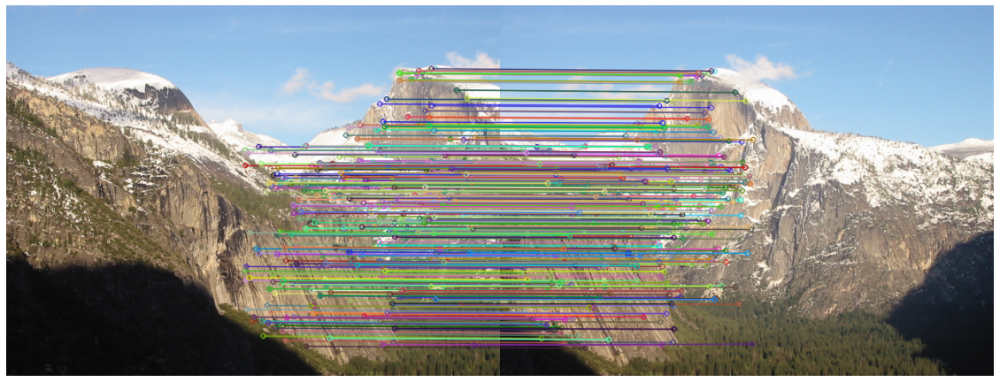

In [37]:
show_random_pairs(yose1color, yose2color, kp1, kp2, narrowed_matches, 520, matchColor=None, figsize=(20,20))

Vemos que para un umbral de 0.3 todas las correspondencias parecen ser correctas.

## Ejercicio 3

En este ejercicio vamos a calcular homografías y reconstruir un mosaico a partir de ellas.

En primer lugar, decidimos las imágenes que vamos a utilizar para el mosaico. 

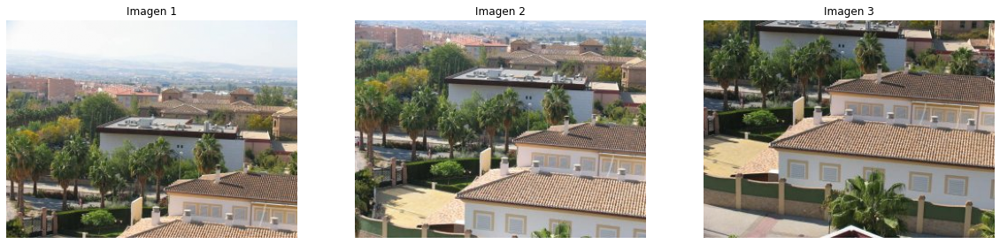

In [61]:
msc1 = cv.imread('./imagenes/mosaico009.jpg')
msc2 = cv.imread('./imagenes/mosaico010.jpg')
msc3 = cv.imread('./imagenes/mosaico011.jpg')

pintaMIE([msc1,msc2,msc3], ["Imagen {}".format(i) for i in range(1,4)], ncol=3, figsize=(20,20))

La imagen 2 será la central. Reconstruiremos la imagen 1 a su izquierda y la 3 a su derecha, dentro de un canvas.

In [62]:
#Detección de keypoints y cómputo de los descriptores 
thres = 0.0001   #Valor mínimo para ser considerado como punto clave. 0.001 es el valor por defecto.
akaze = cv.AKAZE_create(threshold=thres)
kp_msc1, desc_msc1 = akaze.detectAndCompute(msc1, None)
kp_msc2, desc_msc2 = akaze.detectAndCompute(msc2, None)
kp_msc3, desc_msc3 = akaze.detectAndCompute(msc3, None)

In [63]:
bf_msc = cv.BFMatcher_create(normType=cv.NORM_L2, crossCheck=True)
matches_msc12 = bf_msc.match(desc_msc1, desc_msc2)
matches_msc23 = bf_msc.match(desc_msc2, desc_msc3)

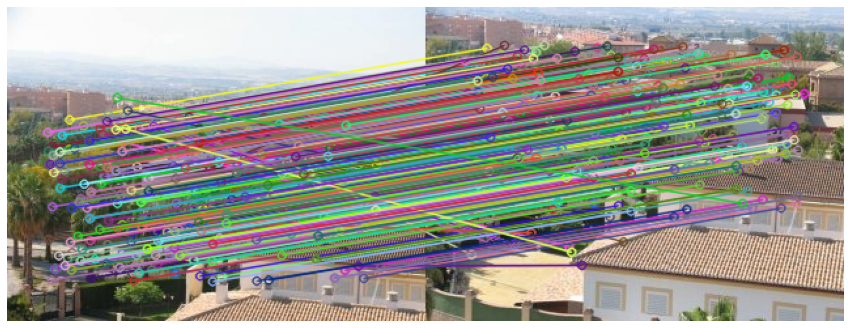

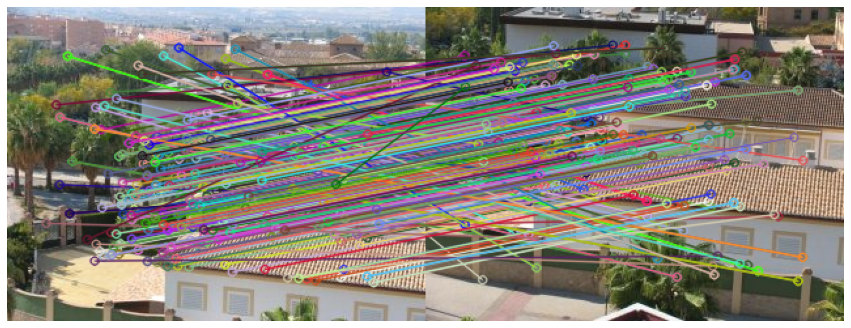

In [64]:
show_random_pairs( msc1, msc2, kp_msc1, kp_msc2, matches_msc12, len(matches_msc12), matchColor=None )
show_random_pairs( msc2, msc3, kp_msc2, kp_msc3, matches_msc23, len(matches_msc23), matchColor=None )

La relación entre cada pareja de imágenes es, aproximadamente, la de una traslación. Por ello y por la gran disonancia entra las líneas dibujadas concluimos que el número de falsos positivos es elevado y preocupante. Probaremos con el método de Lowe usado anteriormente para eliminar las correspondencias que pudieran suponer un problema.

In [65]:
narrowed_matches_msc12 = narrow_matches_with_lowe2NN(desc_msc1, desc_msc2, matches_msc12, thres=0.3)
narrowed_matches_msc23 = narrow_matches_with_lowe2NN(desc_msc2, desc_msc3, matches_msc23, thres=0.3)

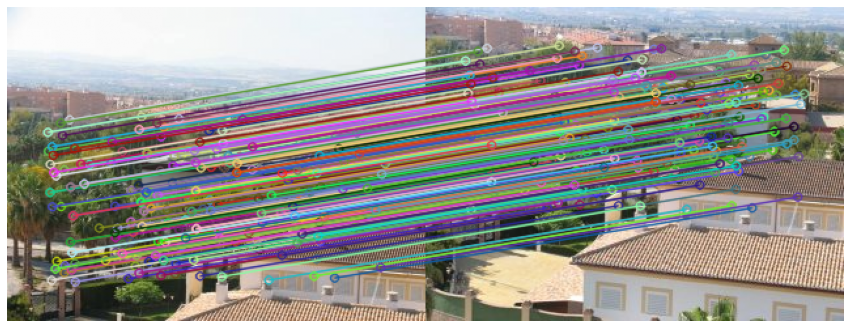

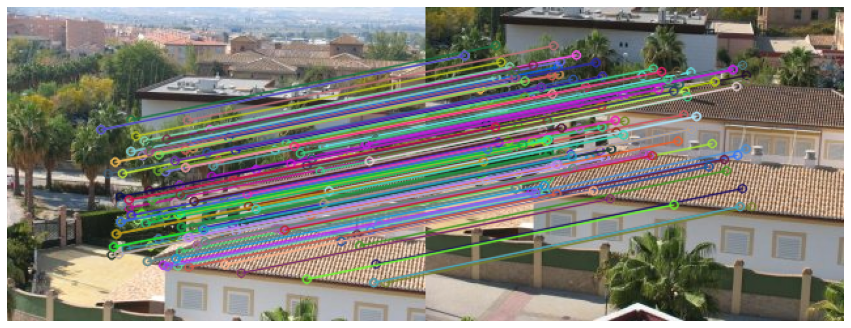

In [66]:
show_random_pairs( msc1, msc2, kp_msc1, kp_msc2, narrowed_matches_msc12, len(narrowed_matches_msc12), matchColor=None )
show_random_pairs( msc2, msc3, kp_msc2, kp_msc3, narrowed_matches_msc23, len(narrowed_matches_msc23), matchColor=None )

Parece que hemos eliminado las correspondencias más problemáticas. Procedemos a la contrucción del mosaico.

In [67]:
#Arrays de keypoints de cada correspondencia
match_msc12_kp = [
                  [ kp_msc1[m.queryIdx].pt for m in narrowed_matches_msc12 ],
                  [ kp_msc2[m.trainIdx].pt for m in narrowed_matches_msc12 ]
]

match_msc23_kp = [
                  [ kp_msc2[m.queryIdx].pt for m in narrowed_matches_msc23 ],
                  [ kp_msc3[m.trainIdx].pt for m in narrowed_matches_msc23 ]
]

Una vez tenemos las correspondencias entre imágenes en una estructura apta para OpenCV, empezamos a calcular las homografías. La primera, $H_0$ será la que lleve la imagen central al centro del canvas. Esta homografía viene dada por una sencilla traslación así que la definiremos manualmente.

In [68]:
canvas_shape = (500,700)
t = [(canvas_shape[1]-msc2.shape[1])/2, (canvas_shape[0]-msc2.shape[0])/2]
H0 = np.array([[1,0,t[0]], [0,1,t[1]], [0,0,1]], dtype=np.float32)

El resto de homografías pueden construirse a partir de las correspondencias calculadas previamente, usando el método *findHomography()* de OpenCV. 

Dado que hemos cribado prácticamente todas las correspondencias más problemáticas y claramente erróneas, podemos usar el método por defecto de *findHomography()*, esto es, optimización por mínimos cuadrados a partir de todas las correspondencias dadas. En caso de que quedasen correspondencias muy desviadas estos casos afectarían negativamente los resultados de la optimización de forma significativa y sería conveniente usar el algoritmo RANSAC (más sobre esto en el Bonus 1).

In [69]:
H1,_ = cv.findHomography( np.array(match_msc12_kp[0]), np.array(match_msc12_kp[1]) )
H2,_ = cv.findHomography( np.array(match_msc23_kp[1]), np.array(match_msc23_kp[0]) )    #Esta homografía lleva los puntos de la imagen de la DERECHA a la imagen CENTRAL 

Las imágenes serán llevadas secuencialmente al plano usando el método *cv.warpPerspective()*. La homografía pasada a dicho método será una composición de todas las homografías que lleven la presente imagen a su siguiente hasta llegar a la central, componiendo la homografía resultante con la $H_0$ que lleva la imagen central al centro del canvas. En este caso las composición de homografías resultante para cada imagen (al haber solo una a cada lado) será $H_0H_1$ para la de la izquierda y $H_0H_2$ para la de la derecha (nótese que la homografía $H_2$ lleva los puntos de la imagen de la derecha en los de la del centro).

Finalmente llamamos a *warpPerspective()* para cada parte del mosaico. Para el correcto funcionamiento de OpenCV y la conservación de cada resultado parcial al obtener el siguiente, usamos el parámetro **borderMode** con valor **cv.BORDER_TRANSPARENT**, pasando el canvas como parámetro para que lo sobreescriba en vez de crear uno nuevo. Si no se cambiase el modo de los bordes el fondo se pondría a negro cada vez que se llamase a la función, eliminando los resultados anteriores. 

En cuanto al orden en el que se va llamando a la función para cada imagen, se han colocado las imágenes a izquierda y derecha antes y, finalmente, la central. El motivo es evitar que deformaciones derivadas de errores en el cálculo de las homografías, aunque no deberían ser pronunciados para solo 3 imágenes, se hagan visibles en zonas compartidas con la imagen central, que no deberían presentar errores.

A modo de anotación, señalamos que el tipo de dato del canvas debe ser establecido necesariamente como el mismo de las imágenes que se desean copiar sobre él (matriz tribanda de 0 como enteros sin signo de 8 bits) para el funcionamiento adecuado de la función.

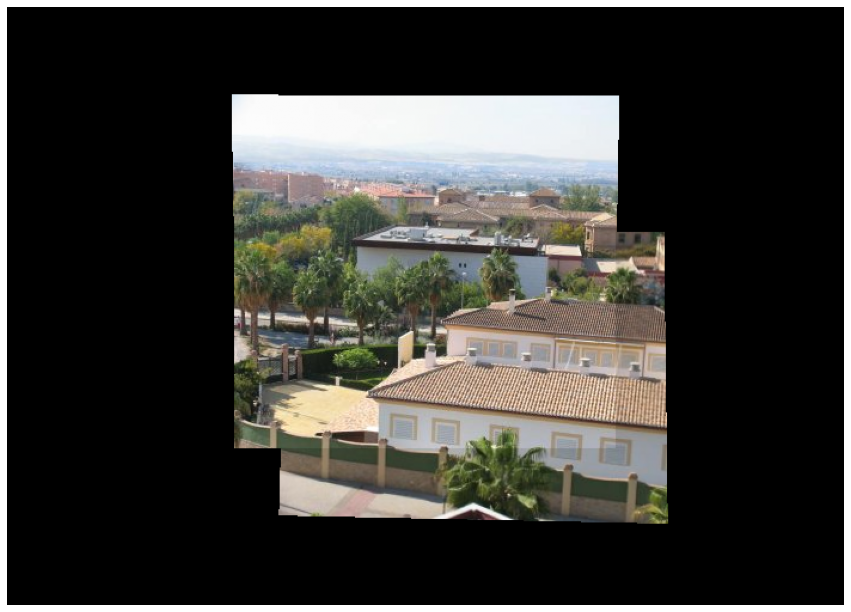

In [71]:
canvas = np.zeros( (canvas_shape[0], canvas_shape[1], 3), dtype='uint8' )

canvas = cv.warpPerspective(msc1, H0@H1, canvas_shape[::-1], canvas, borderMode=cv.BORDER_TRANSPARENT)
canvas = cv.warpPerspective(msc3, H0@H2, canvas_shape[::-1], canvas, borderMode=cv.BORDER_TRANSPARENT)  #Recordamos que H2 lleva msc3 en msc2
canvas = cv.warpPerspective(msc2, H0, canvas_shape[::-1], canvas, borderMode=cv.BORDER_TRANSPARENT)

pintaI(canvas, figsize=(15,15))

Recordamos que el enunciado pide que todo el proceso anterior venga implementado en una función. La función final generalizada que hace todo el trabajo se ha llamado *build_mosaic()* y puede verse a continuación.

Los parámetros establecidos por defecto para la detección de puntos AKAZE son 0.0001 como umbral del descriptor AKAZE y 0.3 como ratio de Lowe máximo, puesto que ya hemos comprobado experimentalmente que esos valores dan resultados buenos en el cálculo de correspondencias entre las imágenes de este mosaico.

In [48]:
def get_good_matches(vim, thres_akaze=0.0001, thres_lowe=0.5):
  #Detección de keypoints y cómputo de los descriptores 
  akaze = cv.AKAZE_create(threshold=thres_akaze)
  kp_desc = [ akaze.detectAndCompute(im, None) for im in vim ]

  bf_msc = cv.BFMatcher_create(normType=cv.NORM_L2, crossCheck=True)
  matches = [ bf_msc.match(kp_desc[i][1], kp_desc[i+1][1]) for i in range(len(kp_desc)-1) ]

  narrowed_matches = [ 
                      narrow_matches_with_lowe2NN(kp_desc[i][1], kp_desc[i+1][1], matches[i], thres=thres_lowe) 
                      for i in range(len(kp_desc)-1) 
                     ]
  return kp_desc, narrowed_matches

def get_central_homography(canvas_shape, cent_img_shape):
  t = [(canvas_shape[1]-cent_img_shape[1])/2, (canvas_shape[0]-cent_img_shape[0])/2]
  return np.array([[1,0,t[0]], [0,1,t[1]], [0,0,1]], dtype=np.float32)

#Devuelve un array con las homografías. La primera se corresponde con la que lleva la
# imagen central al centro del canvas
def get_homographies(canvas_shape, cent_img_shape, match_kp, id_cent):
  H0 = get_central_homography(canvas_shape, cent_img_shape)
  H = [H0]
  for k, m_kp in enumerate(match_kp):
    i,j = (0,1) if k<id_cent else (1,0)
    Hi,_ = cv.findHomography( np.array(m_kp[i]), np.array(m_kp[j]) )
    H.append(Hi)
  return H 

def assemble_mosaic(vim, H, canvas_shape):
  id_cent = len(vim)//2
  canvas = np.zeros( (canvas_shape[0], canvas_shape[1], 3), dtype='uint8' )

  #Aplicamos las homografías a las imágenes a la izquierda de la central y las pegamos al canvas (de izquierda a derecha)
  h = [ H[0] ]
  for i in reversed(range(1,id_cent+1)):
    h.insert(0, h[0]@H[i])    #Aplicamos un algoritmo de scan acumulado componiendo homografías
  for i in range(0, id_cent):    
    canvas = cv.warpPerspective(np.copy(vim[i]), h[i], canvas_shape[::-1], canvas, borderMode=cv.BORDER_TRANSPARENT, borderValue=0)
  
  #Análogo para las imágenes a la derecha de la central (ahora pegándolas de derecha a izquierda)
  h = [ H[0] ]
  for i in range(id_cent+1, len(vim)):
    h.insert(0, h[0]@H[i])
  for i in range(0, id_cent):    
    canvas = cv.warpPerspective(np.copy(vim[len(vim)-i-1]), h[i], canvas_shape[::-1], canvas, borderMode=cv.BORDER_TRANSPARENT, borderValue=0)

  #Por último, añadimos la imagen central al canvas
  canvas = cv.warpPerspective(np.copy(vim[id_cent]), H[0], canvas_shape[::-1], canvas, borderMode=cv.BORDER_TRANSPARENT, borderValue=0)

  return canvas

def build_mosaic(vim, canvas_shape=(500,700), thres_akaze=0.0001, thres_lowe=0.3):
  assert len(vim) > 1
  kp_desc, matches = get_good_matches(vim, thres_akaze, thres_lowe)

  #Arrays de keypoints de cada correspondencia (de la imagen de partida y de su siguiente)
  match_kp = [
              [
               [ kp_desc[i][0][m.queryIdx].pt for m in matches[i] ],
               [ kp_desc[i+1][0][m.trainIdx].pt for m in matches[i] ]
              ]
              for i in range(len(matches))
  ]

  id_cent = len(vim)//2
  H = get_homographies(canvas_shape, vim[id_cent].shape, match_kp, id_cent)
  mosaic = assemble_mosaic(vim, H, canvas_shape)
  return mosaic

Como anotación sobre la implementación realizada de la fase de reconstrucción del mosaico, la composición de homografías de dos imágenes consecutivas a un mismo lado de la central comparten parte del proceso de cálculo. A modo de ejemplo, la composición correspondiente a la primera imagen a la izquierda de la central sería de la forma $H_0H_i$, mientras que la correspondiente a la imagen a su izquierda sería $H_0H_iH_{i-1}$, y así sucesivamente hasta la primera. El caso de las imágenes a la derecha de la central es análogo, si consideramos que dichas homografías se han calculado en sentido inverso (llevan los puntos de la imagen a la derecha a los de su izquierda). Teniendo esto en cuenta, se ha calculado la totalidad de las composiciones de homografías con un algoritmo del tipo *cumulative scan*, es decir, en un orden que permita aprovechar los cálculos ya realizados.

Por lo demás, el proceso es una sencilla generalización de lo expuesto anteriormente en este mismo ejercicio para un número arbitrario de imágenes.

El orden del array de imágenes que se le pasa de entrada a la función es importante, puesto que se espera que indique la posición relativa real de unas respecto a las otras. Esto es, la primera imagen debe compartir regiones con la segunda, esta también con la tercera, y así sucesivamente. Para la imagen central siempre se considera aquella de índice $\lfloor{N_{img}\over2}\rfloor$.

Al reconstruir el mosaico, tal como se hizo en el caso para 3 imágenes, se empiezan colocando aquellas imágenes más alejadas del centro. De esta forma, al superponer cada imagen con la siguiente, más cercana al centro, esperamos paliar errores arrastrados del cálculo sucesivo de homografías.

Finalmente, comprobamos que funcione para el mismo ejemplo de 3 imágenes anterior.

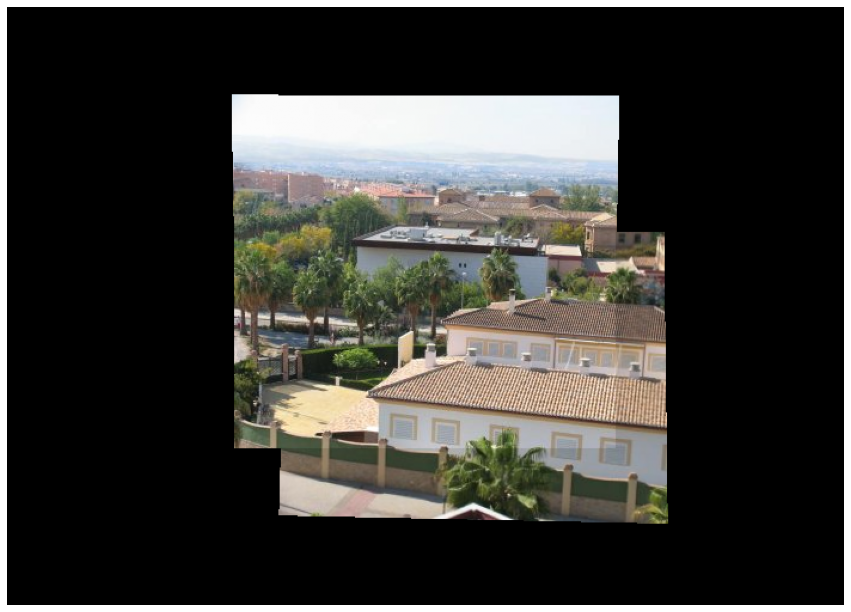

In [49]:
mosaic = build_mosaic( [msc1,msc2,msc3], thres_lowe=0.3 )
pintaI(mosaic, figsize=(15,15))

Los resultados son los mismos que los ya vistos previamente.

## Ejercicio 4

Reconstrucción del mosaico completo.

La única diferencia es que ahora la reconstrucción de cada parte del mosaico puede depender de las homografías calculadas para otras imágenes. Como hemos establecido parámetros por defecto para la función implementada en el ejercicio 3 que ya nos habían dado resultados buenos en el cálculo de correspondencias esto no tiene por que suponer un problema grave.

Cargamos todas las partes del mosaico en orden.

In [50]:
imagenes = [ cv.imread('./imagenes/mosaico00{}.jpg'.format(str(i))) for i in range(2,10) ]
imagenes.append(cv.imread('./imagenes/mosaico010.jpg'))
imagenes.append(cv.imread('./imagenes/mosaico011.jpg'))

Reconstruimos el mosaico mediante la función *build_mosaic()*.

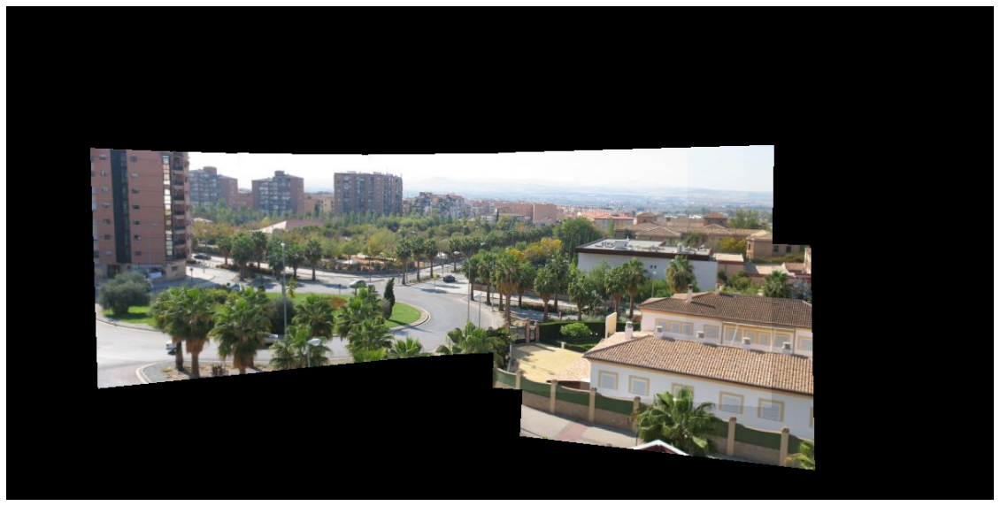

In [51]:
mosaic = build_mosaic(imagenes, canvas_shape=(600,1200))
pintaI(mosaic, figsize=(20,17))

Al margen de algunos cambios de iluminación bruscos en la superposición entre distintas imágenes, los resultados obtenidos son buenos.

## BONUS 1:

Implementación en tiempo real del algoritmo RANSAC para correspondencias a partir de puntos Harris. 

Asumimos que las correspondencias nos son dadas. Usaremos, a modo de ejemplo, las correspondencias obtenidas en el ejercicio 2 antes de su reducción mediante el método de Lowe-Average-2NN. El motivo es demostrar que el algoritmo RANSAC nos permite obtener resultados mejores que los del método de mínimos cuadrados por defecto de OpenCV cuando el número de *outliers* es pronunciado.

El algoritmo RANSAC toma sucesivamente $s$ muestras aleatorias de una población (en esta caso, 4 correspondencias entre dos imágenes) y forma un modelo a partir de ellas (una homografía). 

Dada esta homografía (modelo), el algoritmo calcula el número de individuos en la población total que cumplen, exacta o aproximadamente, este modelo. En nuestro caso eso se ha calculado aplicando las homografías sobre los puntos clave de una imagen y comprobando si el resultado se encontraba a menos de cierto número de píxeles de su pareja correspondiente. Se ha fijado por defecto el máximo de píxeles de distancia a 1, obteniendo buenos resultados.

La selección de una muestra y la construcción del modelo se repite sucesivamente hasta tener una confianza suficiente, mayor que una cierta probabilidad $p$, de que se ha construido al menos un modelo a partir de una muestra carente de *outliers*. El número de repeticiones mínimas para ello se calcula a partir de este valor de $p$ y de un valor estimado del número de *outliers* presentes en la población, $e$. Para ganar en eficiencia, este valor inicial estimado de *outliers* se modifica al encontrar un modelo que ajuste a un ratio de la población mayor que $1-e$, esto es, cuando encontramos un modelo que ajusta a más población de la que estimábamos en un principio. El número mínimo de iteraciones se calcula de la siguiente forma:

$$N={\ln(1-p)\over\ln(1-(1-e)^s)}$$

$N$ también se recalcula cada vez que modificamos el valor de $e$. Siguiendo las indicaciones dadas por el profesor en clase de teoría, el número máximo de iteraciones se ha fijado a $2N$.

Para obtener resultados en tiempo real, se han utilizado extensivamente las capacidades de **cómputo vectorial** de Numpy. 

In [52]:
from math import log

#p es la probabilidad deseada de encontrar una solución si outliers
#e es la proporción estimada de outliers
def RANSAC(kp1, kp2, matches, p=0.99, max_pixels=1, e=0.5):
  s = 4
  i = 0
  best_H = None
  max_count = 0
  total_matches = len(matches)
  corners = np.array([ (kp1[m.queryIdx].pt, kp2[m.trainIdx].pt) for m in matches ])
  N = log(1-p)/log(1-(1-e)**s)  # -----> nº de iteraciones de RANSAC (puede modificar a lo largo del proceso)
  while i<2*N:
    #Tomamos la muestra actual (4 puntos)
    sample = np.random.choice(matches, s)
    #Tomamos los puntos de sus respectivas correspondencias
    sample_corners = np.array([ (kp1[m.queryIdx].pt, kp2[m.trainIdx].pt) for m in sample ])
    #Calculamos la homografía que lleva los puntos de la imagen de origen en la de destino
    H,_ = cv.findHomography(sample_corners[:,0], sample_corners[:,1])
    #Imágenes de los puntos de las esquinas de la imagen de origen por la Homografía H 
    image_corners = (((H[0:2,0:2]@corners[:,0].T).T + H[0:2,2]).T/(H[2,0:2]@corners[:,0].T + 1)).T
    #Contamos el número de esquinas de la imagen 1 cuyo punto asociado por H está 
    # suficientemente cerca de su correspondencia en la imagen 2
    count = np.count_nonzero(np.linalg.norm(image_corners-corners[:,1], axis=1) < max_pixels)
    if count > max_count:
      max_count = count
      estim = 1-(count/total_matches)   #Recalculamos el valor estimado de outliers
      #Si es menor de lo que esperábamos, lo sustituimos y recalculamos N
      if estim < e:
        e = estim
        N = log(1-p)/log(1-(1-e)**s)
      best_H = H
    i += 1
  return best_H

Calculamos los descriptores de ambas imágenes, sus puntos claves y las correspondencias entre ellos, tal como hicimos en el ejercicio 2.

In [53]:
#Detección de keypoints y cómputo de los descriptores 
nOct = 3  #Nº de niveles en los que AKAZE busca keypoints. 4 es el valor por defecto.
thres = 0.0004   #Valor mínimo para ser considerado como punto clave. 0.001 es el valor por defecto.
akaze = cv.AKAZE_create(threshold=thres, nOctaves=nOct)
kp1, desc1 = akaze.detectAndCompute(yose1color, None)
kp2, desc2 = akaze.detectAndCompute(yose2color, None)

bf = cv.BFMatcher_create(normType=cv.NORM_L2, crossCheck=True)
matches = bf.match(desc1, desc2)
#matches = narrow_matches_with_lowe2NN(desc1, desc2, matches, thres=0.5)

Probamos a ejecutar el algoritmo. Buscamos resultados en tiempo real, así que aplicaremos un *profiling* sencillo a su ejecución. La macro %time de Python permite medir el tiempo necesario para ejecutar una sentencia.

In [54]:
%time RANSAC(kp1, kp2, matches)

CPU times: user 38.7 ms, sys: 0 ns, total: 38.7 ms
Wall time: 40.5 ms


array([[ 1.06599675e+00, -1.12496987e-03, -2.99246993e+02],
       [ 2.53704983e-02,  1.04751226e+00, -9.98688648e+00],
       [ 1.01472789e-04,  5.33602745e-06,  1.00000000e+00]])

Repitiendo la celda anterior tantas veces como se quiera, observamos que el tiempo de ejecución de nuestra implementación de RANSAC es de unos 50ms, lo cual equivale a unas 20 ejecuciones por segundo.

Ahora vamos a comprobar que los resultados que obtenemos son correctos.

In [55]:
H = RANSAC(kp1, kp2, matches)
H

array([[ 1.08441486e+00, -2.33374410e-03, -3.04836478e+02],
       [ 3.67300723e-02,  1.05950070e+00, -1.53605548e+01],
       [ 1.32929550e-04, -1.33682569e-06,  1.00000000e+00]])

La matriz de la homografía resultante es, aproximadamente, la correspondiente a una traslación, acorde con lo que vimos en el ejercicio 2.

Ahora vamos a comparar nuestros resultados con los obtenidos mediante distintas implementaciones de OpenCV.

In [56]:
corners = np.array([ (kp1[m.queryIdx].pt, kp2[m.trainIdx].pt) for m in matches ])

Probamos utilizando el método de mínimos cuadrados por defecto. Como hay numerosas correspondencias falsas esperamos unos resultados muy desviados.

In [57]:
cvH,_ = cv.findHomography(corners[:,0], corners[:,1], method=0)
cvH

array([[-9.34662971e-01, -1.45999624e-01,  2.39649420e+02],
       [-1.02232571e+00, -2.41727022e-01,  2.78612867e+02],
       [-3.85162649e-03, -6.94317402e-04,  1.00000000e+00]])

Ahora probamos con el método RANSAC de OpenCV.

In [58]:
cvH_ransac,_ = cv.findHomography(corners[:,0], corners[:,1], method=cv.RANSAC)
cvH_ransac

array([[ 1.06761913e+00, -1.44447868e-03, -2.99847973e+02],
       [ 2.80558415e-02,  1.04904941e+00, -1.16100812e+01],
       [ 1.03830210e-04,  4.03576156e-06,  1.00000000e+00]])

Vemos que los resultados de aplicar RANSAC con OpenCV son muy similares a los obtenidos por nuestra implementación, por lo que podemos considerar que los resultados son buenos.

A modo de prueba, construiremos un mosaico con las imágenes de Yosemite usadas para el ejercicio 1 y la homografía H recién calculada por nuestra implementación.

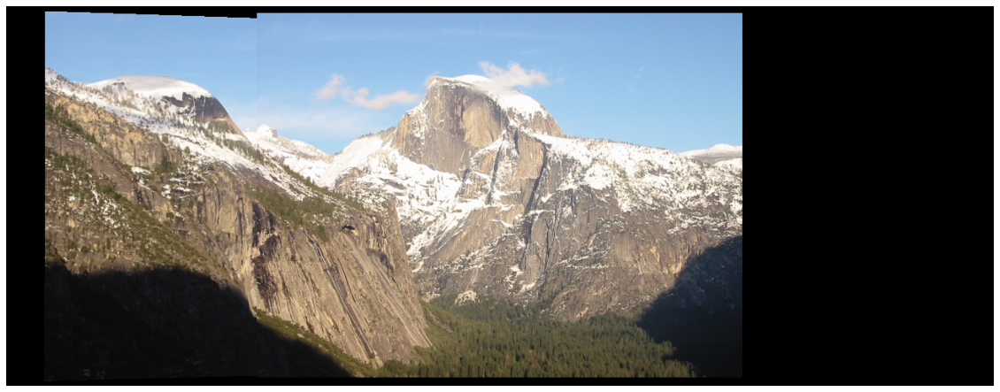

In [59]:
canvas_shape = (500, 1300)
flags = cv.INTER_LINEAR
canvas = np.zeros( (canvas_shape[0], canvas_shape[1], 3), dtype='uint8' )

H0 = get_central_homography(canvas_shape, yose2color.shape)

canvas = cv.warpPerspective(yose1color, H@H0, canvas_shape[::-1], canvas, flags=flags, borderMode=cv.BORDER_TRANSPARENT)
canvas = cv.warpPerspective(yose2color, H0, canvas_shape[::-1], canvas, flags=flags, borderMode=cv.BORDER_TRANSPARENT)

pintaI(canvas, figsize=(20,17))

Salvo por un pequeño cambio de iluminación en los bordes, los resultados son buenos. Como comparación construiremos también el mosaico con la homografía calculada por OpenCV usando RANSAC.

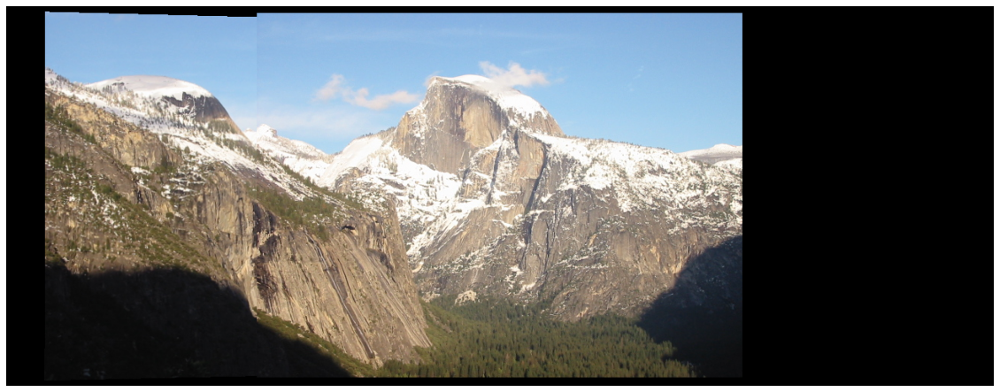

In [60]:
canvas_shape = (500, 1300)
flags = cv.INTER_LINEAR
canvas = np.zeros( (canvas_shape[0], canvas_shape[1], 3), dtype='uint8' )

H0 = get_central_homography(canvas_shape, yose2color.shape)

canvas = cv.warpPerspective(yose1color, cvH_ransac@H0, canvas_shape[::-1], canvas, flags=flags, borderMode=cv.BORDER_TRANSPARENT)
canvas = cv.warpPerspective(yose2color, H0, canvas_shape[::-1], canvas, flags=flags, borderMode=cv.BORDER_TRANSPARENT)

pintaI(canvas, figsize=(20,17))

Los resultados son prácticamente iguales.

## **Referencias**

1.   [Multi-Image Matching using Multi-Scale Oriented Patches](http://matthewalunbrown.com/papers/cvpr05.pdf). *Matthew Brown, Richard Szeliski, Simon Winder*.
2.   [Documentación de la API de OpenCV sobre tansformaciones geométricas.](https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87)
3.   [Documentación de la API de OpenCV sobre reconstrucción 3D.](https://docs.opencv.org/master/d9/d0c/group__calib3d.html#ga4abc2ece9fab9398f2e560d53c8c9780)
4.   [Documentación de Numpy.](https://numpy.org/doc/stable/)
5.   [Ejemplo en la web oficial de OpenCV sobre cálculo de correspondencias y homografías.](https://docs.opencv.org/master/d1/de0/tutorial_py_feature_homography.html)
6.   [Respuesta en StackOverflow sobre el ratio de Lowe.](https://stackoverflow.com/questions/51197091/how-does-the-lowes-ratio-test-work)
7.   [Ejemplo en medium.com sobre la construcción de panoramas.](https://medium.com/@navekshasood/image-stitching-to-create-a-panorama-5e030ecc8f7)
8.   Diapositivas de clase sobre detección de puntos relevantes y construcción de panoramas (en especial, sección sobre RANSAC).
